<a href="https://colab.research.google.com/github/durgasreeborra/topic-modeling-on-news-articles/blob/main/Copy_of_Welcome_To_Colaboratory.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Project Name -TOPIC MODELLING ON NEWS ARTICLES**




 **Project Type**-Unsupervised

**Team Contribution**-V.Jashwanth, P.Bhaskar,K.Meghana,B.Durgasree

#**Project Summary-**

The project focuses on implementing topic modeling techniques to analyze a large corpus of news articles. Our objective is to uncover the latent themes and subjects present in this vast collection of news data. By employing methods like Latent Dirichlet Allocation (LDA) or Latent Semantic Analysis (LSA), we aim to automatically categorize articles into coherent topics, providing valuable insights into the key issues and trends within the news domain. This will enhance our ability to organize, search, and summarize news content, aiding both researchers and readers in navigating the ever-expanding world of news. The project not only addresses information retrieval challenges but also holds the potential to improve content recommendation systems and enhance our understanding of the underlying dynamics in news reporting.

#**GitHUb Link-**

https://github.com/durgasreeborra/topic-modeling-on-news-articles

#**Problem Statement-**

In this project your task is to identify major themes/topics across a collection of BBC news articles. You can use clustering algorithms such as Latent Dirichlet Allocation (LDA), Latent Semantic Analysis (LSA) etc

#**Business Context**

In the business context, our project on topic modeling for news articles holds significant potential for various applications. Our primary objective is to automatically categorize and tag news articles, making content management more efficient for news organizations. This enhances user experience and engagement, which, in turn, can drive higher advertising revenue for online news platforms. Simultaneously, we employ sentiment analysis to understand the emotional tone of news stories, providing insights into how news impacts reader sentiment. This information is invaluable for content optimization, tailoring marketing strategies, and maintaining reader satisfaction.
Furthermore, our topic modeling approach helps identify emerging trends, allowing businesses to stay ahead of the curve by anticipating shifts in public interest. It also contributes to market research and competitive analysis. By tracking topics related to industries, companies, and key issues, businesses can make more informed strategic decisions and adapt to changing market conditions.



#**Data  understanding**

1. ***Data Collection***: Understand where and how the news articles were collected. Are they from specific sources or scraped from the web? Knowing the data sources is crucial for assessing credibility.

2. ***Data Size and Composition***: Determine the size of your dataset and its composition in terms of categories, publication dates, and article lengths. This helps in assessing the diversity of content.

3. ***Data Quality***: Examine data quality by checking for missing values, duplicates, and inconsistencies. Address any issues to ensure the dataset is clean and reliable.

4. ***Text Preprocessing***: Understand the preprocessing steps applied to the text data, such as text cleaning, tokenization, and stop word removal. Knowledge of preprocessing steps is essential for interpreting topic results.


5. ***Content Sampling***: Consider taking random samples of articles from different categories to gauge the content's representativeness and quality.

6. ***Domain Knowledge***: Acquire domain knowledge about the news articles, including common topics, terminology, and key entities. This knowledge helps in topic labeling and interpretation.

7. ***Data Exploration***: Use data visualization and statistical analysis to explore the dataset's characteristics. This may involve creating word clouds, histograms of article lengths, and date distributions.

8. ***Language and Text Complexity***: Understand the language and text complexity in the articles. Consider language variations, readability, and specialized jargon.

9. ***Content Bias***: Be aware of any potential biases in the data, such as political or cultural biases. Address these biases during preprocessing and analysis.

10. ***Data Licensing***: If applicable, review data licensing agreements to ensure compliance with usage rights and restrictions.

#**Work Flow Diagram**

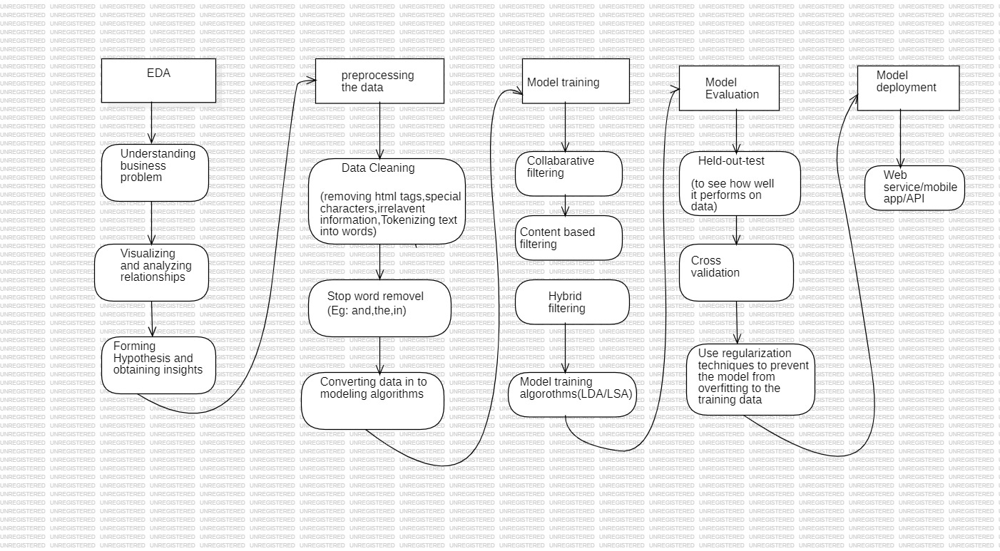

#**Let's Begin !**


**Connecting To Drive**

In [1]:
import os
from google.colab import drive
drive.mount("/content/drive/")

Mounted at /content/drive/


**Data Ingestion**

### We are given a dataset that contains 5 categories of data.each categiry contains no.of text files.so,we need to read each text file.for that i am storing the dataset in the dictionary where each key describes the category of the data and value contains the list of text files of each category.


In [2]:

data = {}
categories = ["business", "entertainment", "politics", "sport", "tech"]

for category in categories:
    category_data = []
    category_dir = os.path.join("/content/drive/MyDrive/data/Temp", category)

    file_list = os.listdir(category_dir)
    for file_name in file_list:
        with open(os.path.join(category_dir, file_name), 'r', encoding='iso-8859-1') as file:
            text = file.read()
            category_data.append(text)
    data[category] = category_data
data

{'business': ['India widens access to telecoms\n\nIndia has raised the limit for foreign direct investment in telecoms companies from 49% to 74%.\n\nCommunications Minister Dayanidhi Maran said that there is a need to fund the fast-growing mobile market. The government hopes to increase the number of mobile users from 95 million to between 200 and 250 million by 2007. "We need at least $20bn (Â£10.6bn) in investment and part of this has to come as foreign direct investment," said Mr Maran. The decision to raise the limit for foreign investors faced considerable opposition from the communist parties, which give crucial support to the coalition headed by Prime Minister Manmohan Singh. Potential foreign investors will however need government approval before they increase their stake beyond 49%, Mr Maran said. Key positions, such as those of chief executive, chief technology officer and chief financial officer are to be held by Indians, he added.\n\nAnalysts and investors have welcomed the

**Data Exploration**

### Let us see what type of data that each file contains in each category by displaying a few documents from each category.

In [3]:
# Display the first few documents
for category, documents in data.items():
    print(f"Category: {category}")
    for i, document in enumerate(documents[:5]):
        print(f"Document {i + 1}: {document[:100]}...")  # Display the first 100 characters


Category: business
Document 1: India widens access to telecoms

India has raised the limit for foreign direct investment in telecom...
Document 2: Slowdown hits US factory growth

US industrial production increased for the 21st month in a row in F...
Document 3: EU ministers to mull jet fuel tax

European Union finance ministers are meeting on Thursday in Bruss...
Document 4: BMW cash to fuel Mini production

Less than four years after the new Mini was launched, German car m...
Document 5: ID theft surge hits US consumers

Almost a quarter of a million US consumers complained of being tar...
Category: entertainment
Document 1: Paraguay novel wins US book prize

A novel set in 19th century Paraguay has won the $10,000 (Â£5,390...
Document 2: Hundreds vie for best film Oscar

A total of 267 films are eligible for the best film Oscar but only...
Document 3: Gallery unveils interactive tree

A Christmas tree that can receive text messages has been unveiled ...
Document 4: Obituary: Dame Al

### I want to understand the data statistics like how many documents present in each category,length of the documents.so,for that purpose i am creating a function which is used to describes the statistics of our dataset

In [4]:
# Statistics
print("\nBasic Statistics:")
category_stats = {}
for category, documents in data.items():
    num_documents = len(documents)
    avg_document_length = sum(len(doc) for doc in documents) / num_documents
    category_stats[category] = {
        "Number of Documents": num_documents,
        "Average Document Length": avg_document_length,
    }


Basic Statistics:


### Now i am going to display the statistics.The output will display category, No.of documents in each category,and avg length of each document.

In [5]:
#displaying the statistics
for category, stats in category_stats.items():
    print(f"Category: {category}")
    print(f"Number of Documents: {stats['Number of Documents']}")
    print(f"Average Document Length: {stats['Average Document Length']}")

Category: business
Number of Documents: 520
Average Document Length: 1987.8346153846153
Category: entertainment
Number of Documents: 386
Average Document Length: 1929.339378238342
Category: politics
Number of Documents: 417
Average Document Length: 2685.0071942446043
Category: sport
Number of Documents: 511
Average Document Length: 1897.4853228962818
Category: tech
Number of Documents: 411
Average Document Length: 2966.2238442822386


### we have text data.so,there is no possibility of missing values.so we don't need to write the code for missing values.

**Categorical Analysis**

### Now, I would like to do more operatoins to understand the data in depth.
### Here i am importing the required libraries for visualization.because,we can easily understand the data with visualization.

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from textblob import TextBlob

### lets do some categorical anlaysis on the data.i am creating a function to perform categorical analysis.it will describes the no.of documents,characters in each text file.

In [7]:
# creating function for Category analysis.
def perform_category_analysis(category_data):
    num_documents = len(category_data)
    total_characters = sum(len(doc) for doc in category_data)
    average_characters = total_characters / num_documents
    return {
        "Num Documents": num_documents,
        "Total Characters": total_characters,
        "Average Characters per Document": average_characters,
    }

### Here i am exploring the data to understand the behaviour of the data more clearly.

In [8]:
# creating function for exploring the data
def explore_data(data):
    exploration_results = {}
    all_articles = []

    for category, category_data in data.items():
        exploration_results[category] = perform_category_analysis(category_data)
        all_articles.extend(category_data)

    total_articles = len(all_articles)
    return exploration_results, total_articles
exploration_results, total_articles = explore_data(data)
print(exploration_results)

{'business': {'Num Documents': 520, 'Total Characters': 1033674, 'Average Characters per Document': 1987.8346153846153}, 'entertainment': {'Num Documents': 386, 'Total Characters': 744725, 'Average Characters per Document': 1929.339378238342}, 'politics': {'Num Documents': 417, 'Total Characters': 1119648, 'Average Characters per Document': 2685.0071942446043}, 'sport': {'Num Documents': 511, 'Total Characters': 969615, 'Average Characters per Document': 1897.4853228962818}, 'tech': {'Num Documents': 411, 'Total Characters': 1219118, 'Average Characters per Document': 2966.2238442822386}}


### Now i want to know the quantity of each category in the entire data.so,we should calculate the percentages of each category.

Categorical Analysis
Category Percentages:
business: 23.16%
entertainment: 17.19%
politics: 18.57%
sport: 22.76%
tech: 18.31%


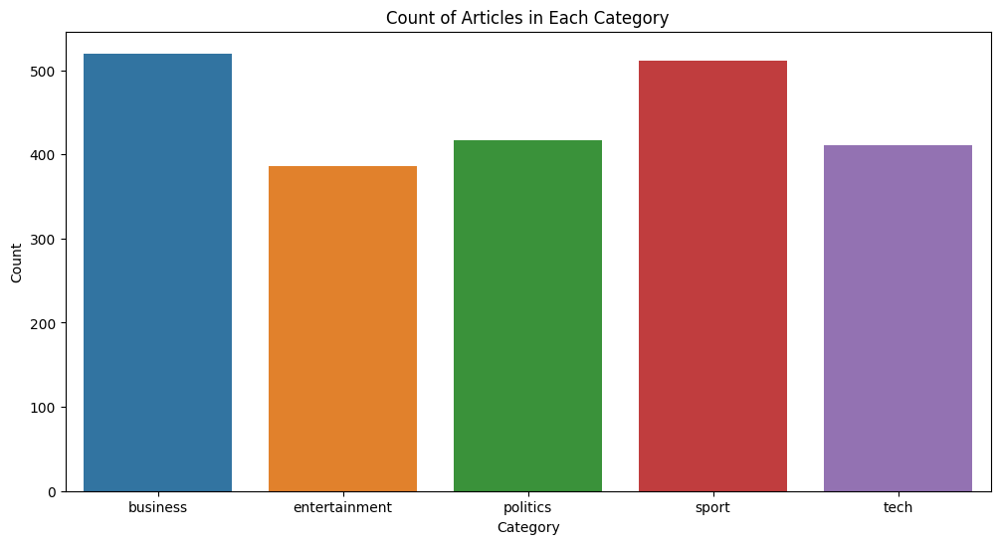

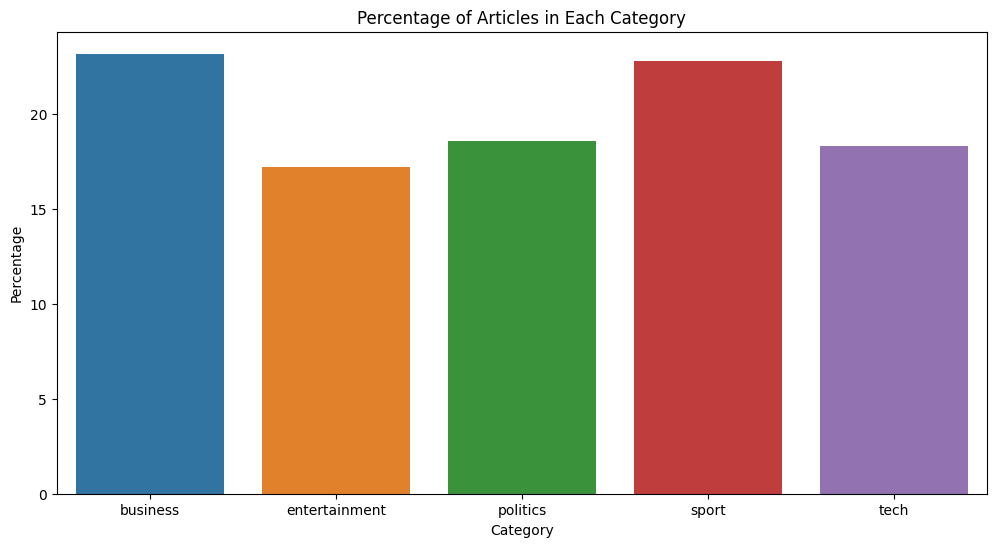

In [9]:
# visualization for percentages.
def analyze_categories(data, total_articles):
    print("Categorical Analysis")
    category_counts = [len(category_data) for category_data in data.values()]

    print("Category Percentages:")
    for category, category_data in data.items():
        print(f"{category}: {len(category_data) / total_articles * 100:.2f}%")

    plt.figure(figsize=(12, 6))
    sns.barplot(x=categories, y=category_counts)
    plt.title('Count of Articles in Each Category')
    plt.xlabel('Category')
    plt.ylabel('Count')

    plt.figure(figsize=(12, 6))
    sns.barplot(x=categories, y=[len(category_data) / total_articles * 100 for category_data in data.values()])
    plt.title('Percentage of Articles in Each Category')
    plt.xlabel('Category')
    plt.ylabel('Percentage')
    plt.show()
analyze_categories(data, total_articles)

### **Sentiment Analysis**

### Once visualizing the percentages.I want to know the tone of the each text in the data.
### Sentiment analysis will analyze the tone of the text.
### It will analyze the data either positive or negative  or neutral text.
### so,I am creating a function that performs sentimental analysis.

In [10]:
def perform_sentiment_analysis(data):
    print("\nSentiment Analysis")
    for category, category_data in data.items():
        print(f"\nCategory: {category}")
        sentiment_scores = [TextBlob(doc).sentiment.polarity for doc in category_data]
        sentiment_labels = ['Positive' if score > 0 else 'Negative' if score < 0 else 'Neutral' for score in sentiment_scores]
        sentiment_df = pd.DataFrame({'Sentiment Score': sentiment_scores, 'Sentiment Label': sentiment_labels})
        print(sentiment_df)
perform_sentiment_analysis(data)


Sentiment Analysis

Category: business
     Sentiment Score Sentiment Label
0           0.021364        Positive
1           0.181667        Positive
2           0.120539        Positive
3           0.154389        Positive
4          -0.053687        Negative
..               ...             ...
515         0.090127        Positive
516         0.115792        Positive
517        -0.053680        Negative
518         0.117682        Positive
519        -0.003889        Negative

[520 rows x 2 columns]

Category: entertainment
     Sentiment Score Sentiment Label
0           0.135726        Positive
1           0.170417        Positive
2          -0.046919        Negative
3           0.153333        Positive
4          -0.042524        Negative
..               ...             ...
381         0.069234        Positive
382         0.049837        Positive
383         0.113769        Positive
384         0.118994        Positive
385         0.106190        Positive

[386 rows x 2 columns]

### **Word Frequency Calculation and Visualization**


Word Frequency Analysis and Visualization

Category: business
Top 10 Most Frequent Words in business Category:
   Word  Frequency
0   the       9229
1    to       5145
2    of       4454
3    in       4126
4     a       3300
5   and       3187
6    is       1623
7   The       1612
8   for       1604
9  that       1547


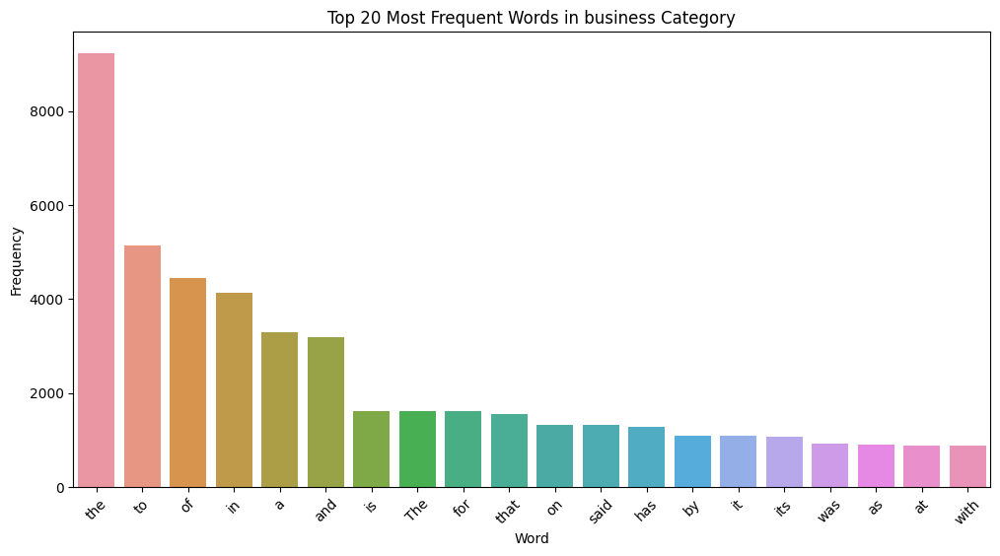


Interpretation:
The word frequency analysis reveals the most frequent terms in the news articles for this category.
Some common words may include generic terms related to the category, but specific keywords may also appear.
These keywords could provide insights into the main topics or subjects covered in the articles.

Category: entertainment
Top 10 Most Frequent Words in entertainment Category:
  Word  Frequency
0  the       6456
1  and       2933
2   of       2926
3   to       2853
4   in       2643
5    a       2496
6  The       1699
7  for       1507
8  was       1129
9   on       1113


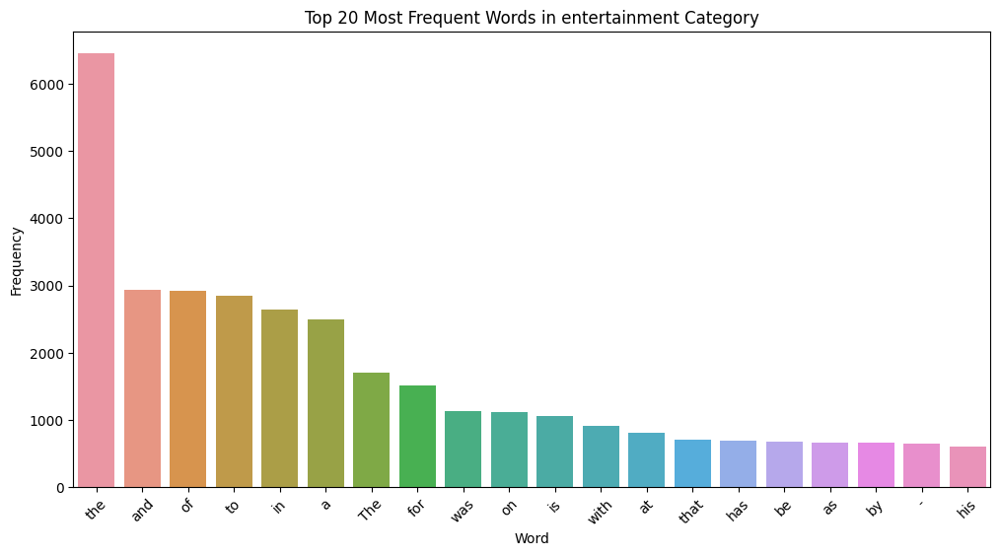


Interpretation:
The word frequency analysis reveals the most frequent terms in the news articles for this category.
Some common words may include generic terms related to the category, but specific keywords may also appear.
These keywords could provide insights into the main topics or subjects covered in the articles.

Category: politics
Top 10 Most Frequent Words in politics Category:
   Word  Frequency
0   the      10569
1    to       5958
2    of       4449
3   and       3776
4     a       3659
5    in       3114
6   for       1859
7    is       1806
8  that       1761
9    on       1737


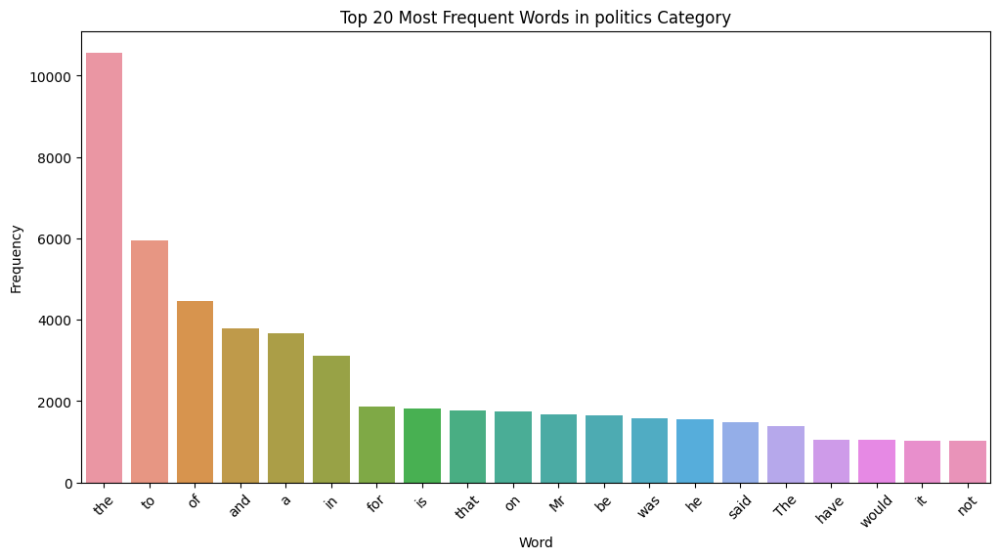


Interpretation:
The word frequency analysis reveals the most frequent terms in the news articles for this category.
Some common words may include generic terms related to the category, but specific keywords may also appear.
These keywords could provide insights into the main topics or subjects covered in the articles.

Category: sport
Top 10 Most Frequent Words in sport Category:
  Word  Frequency
0  the       8651
1   to       4663
2    a       3673
3   in       3521
4  and       3446
5   of       2792
6  for       1711
7   is       1470
8   on       1432
9  was       1421


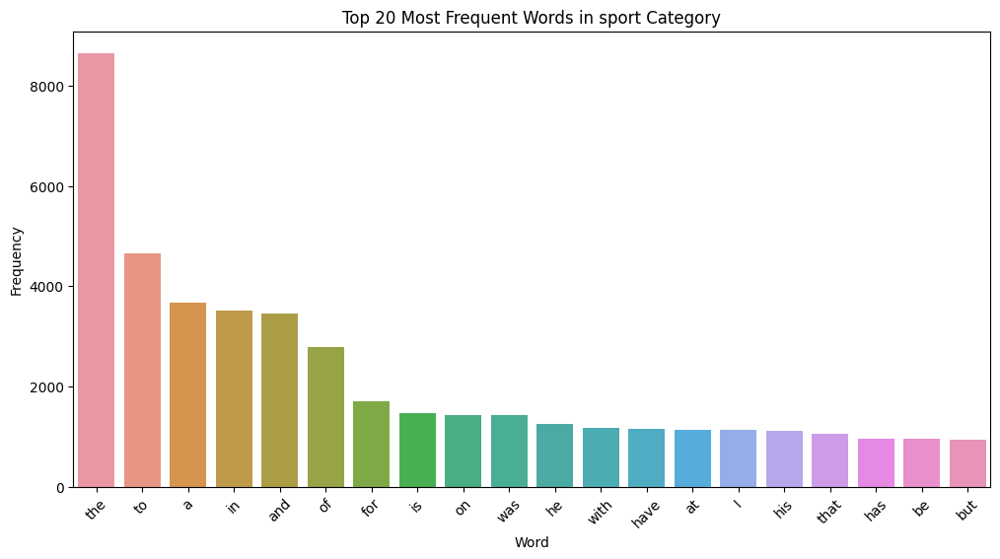


Interpretation:
The word frequency analysis reveals the most frequent terms in the news articles for this category.
Some common words may include generic terms related to the category, but specific keywords may also appear.
These keywords could provide insights into the main topics or subjects covered in the articles.

Category: tech
Top 10 Most Frequent Words in tech Category:
   Word  Frequency
0   the       9958
1    to       6394
2    of       5418
3   and       4710
4     a       4151
5    in       3213
6    is       2549
7  that       2537
8   for       2045
9   The       1774


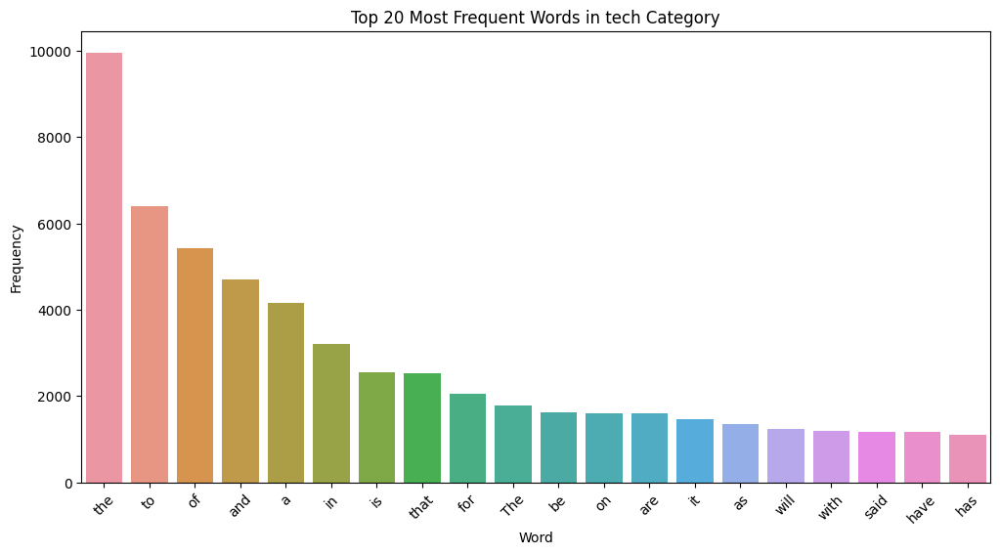


Interpretation:
The word frequency analysis reveals the most frequent terms in the news articles for this category.
Some common words may include generic terms related to the category, but specific keywords may also appear.
These keywords could provide insights into the main topics or subjects covered in the articles.


In [11]:
def word_frequency_analysis(data):
    print("\nWord Frequency Analysis and Visualization")
    for category, category_data in data.items():
        print(f"\nCategory: {category}")
        category_corpus = ' '.join(category_data)
        words = category_corpus.split()
        word_frequencies = pd.Series(words).value_counts().reset_index()
        word_frequencies.columns = ['Word', 'Frequency']
        print(f"Top 10 Most Frequent Words in {category} Category:")
        print(word_frequencies.head(10))

        plt.figure(figsize=(12, 6))
        sns.barplot(x='Word', y='Frequency', data=word_frequencies.head(20))
        plt.title(f'Top 20 Most Frequent Words in {category} Category')
        plt.xlabel('Word')
        plt.ylabel('Frequency')
        plt.xticks(rotation=45)
        plt.show()

        print("\nInterpretation:")
        print("The word frequency analysis reveals the most frequent terms in the news articles for this category.")
        print("Some common words may include generic terms related to the category, but specific keywords may also appear.")
        print("These keywords could provide insights into the main topics or subjects covered in the articles.")
word_frequency_analysis(data)

### **Word Cloud Visualization**


Word Cloud Visualization

Category: business


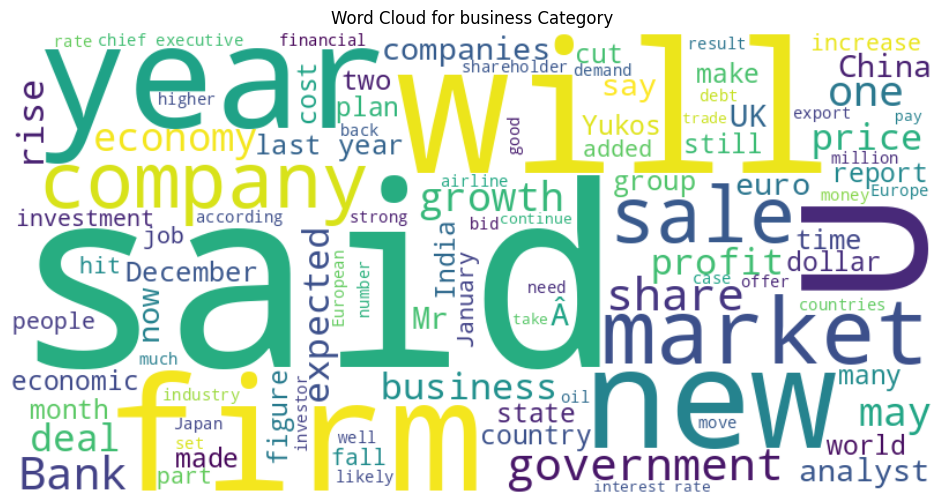


Category: entertainment


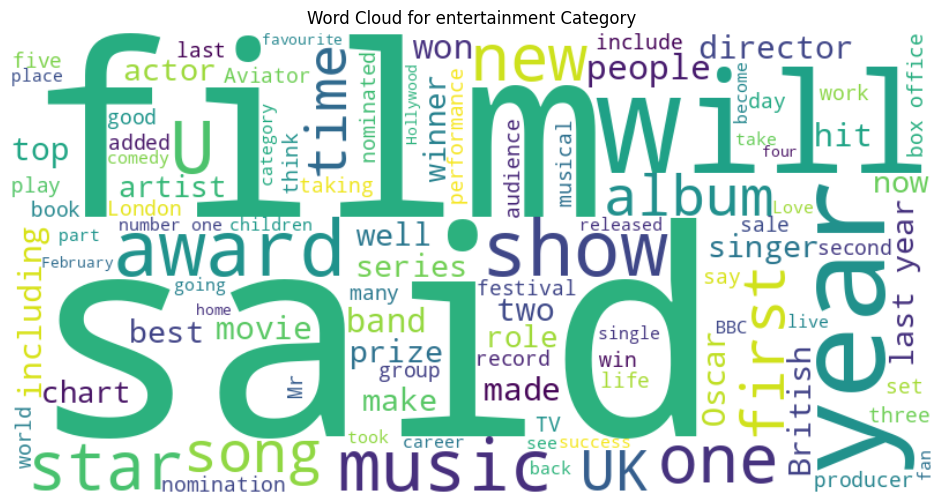


Category: politics


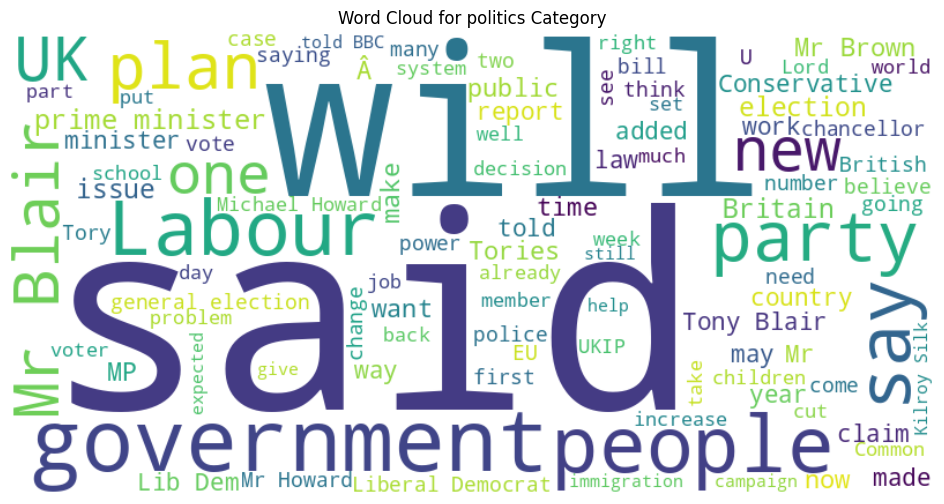


Category: sport


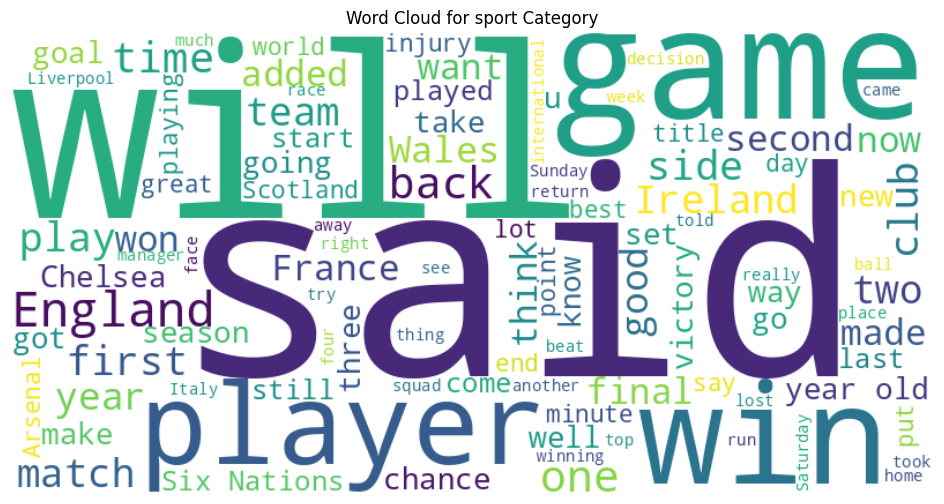


Category: tech


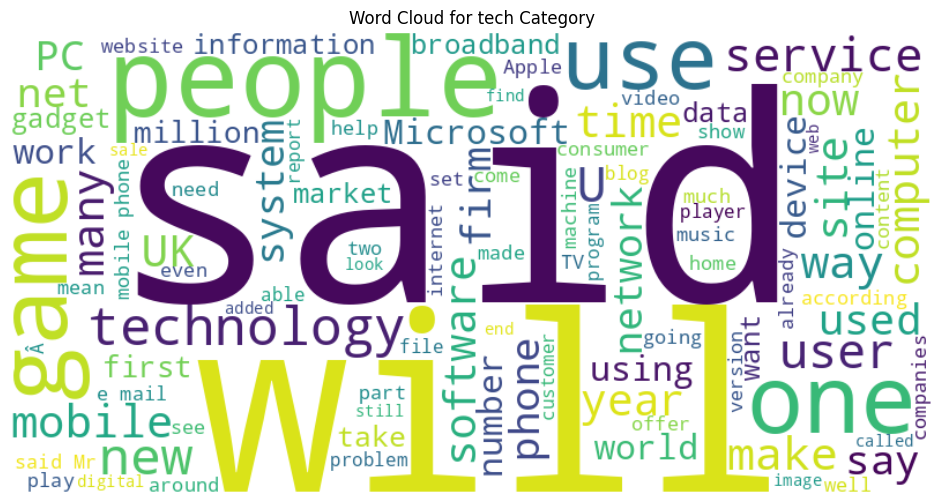

In [12]:
# function for visualizing the most frequent words.
def generate_word_cloud(data):
    print("\nWord Cloud Visualization")
    for category, category_data in data.items():
        print(f"\nCategory: {category}")
        category_corpus = ' '.join(category_data)
        wordcloud = WordCloud(width=800, height=400, max_words=100, background_color='white').generate(category_corpus)
        plt.figure(figsize=(12, 6))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'Word Cloud for {category} Category')
        plt.axis('off')
        plt.show()
generate_word_cloud(data)

## **Data Pre-Procesing**

### pre-processing is the key step before going to train the model.
### we should do pre-processing inorder to make our data clean that helps to trail the model more effectively.
### Our data contains only text data.so,we should use NLP pre-processing tecniques inorder to preprocess the text data.
### now we need to import the required libraries.

In [13]:
import pandas as pd
import numpy as np
import nltk

**Tokenization**

### Tokenization is the process of generating tokens for rach word.I am creating a functoin for tokenization.

In [14]:
from nltk.tokenize import word_tokenize

In [15]:
def tokens(text):
    tokenization=word_tokenize(text)
    return ' '.join(i for i in tokenization)

**Punctuation Removing**

### Inorder to train the model more accurately we need to remove the punctuations from the given data.for that i am creating a function for removing the punctuation.

In [16]:
import string

In [17]:
def punctuation_removal(text):
    return ''.join(word for word in text if word not in string.punctuation)

**Removing Stop words**

### 1.stop words are the words in a language that are not much important in trainig the model.
### 2.stop words do not contribute to the meaning of a sentence and can actually slow down NLP processing.
### 3.so we need to remove the stop words present in our data.
### 4.To remove the stop words we need to download stop words from NLTK.corpus.

In [18]:
from nltk.corpus import stopwords
#downloading stopwords
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

### Let us see what are the stop words present in 'English' language.

In [19]:
#view stopwords in 'english' language
print(stopwords.words('english'))

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

### Now I am creating a function to remove stop words.
### It takes one text file in each iteration.

In [20]:
# function for removing stopwords.
def stop(text):
    stop_word=stopwords.words('english')
    without_stopwords=[]
    #split the text into words
    for i in text.split():
      #add words to list defined above which are not in stopwords
        if i not in stop_word:
            without_stopwords.append(i)
    # join the words in the list
    return ' '.join(i for i in without_stopwords)

**Performing pre-processing on our data**

### Till now we have created some functions for pre-processing the data.
### now let use them in our original data to preprocess.
### You can easily undersatnd the function as i have written the comments in the function.

In [21]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [22]:
#Accessing the each file from the dictionary
for value in data.values():
    cleaned_data=[]
    for text in value:
        # Removing punctuation and converting into lowercase
        punct=punctuation_removal(text.lower())
        # removing stopwords
        new_words=stop(punct)
        # tokenization and adding result to the list
        cleaned_data.append(tokens(new_words))
cleaned_data

['telewest challenge sky plus cable firm telewest offer personal video recorder pvr set top box challenge sky plus sky plus market leader field digital video recorders uk 474000 subscribers pvrs record tv programmes hard drive letting viewers pause rewind live television effectively time shift viewing experience number pvrs incorporating freeview digital terrestrial tv also market success limited telewests pvr offer 160gb hard drive storage 80 hours programmes box three tuners means viewers record two channels simultaneously watching third channel sky plus boxes come two versions 20gb version â£99 160gb version â£399 sky also charges â£10 subscription fee service unless viewers subscription one premium packages telewest yet reveal pricing new box charging subscription fee service eric tveter president chief operating officer telewest broadband said make pvr settop box available later year putting stop missed soaps interrupted films arguments programmes record pvrs recordable dvd player

**Stemming**

### Now let us perform stemming.
### It is one of the preprocessing technique to remove the affixes(prefix,suffix,infix).
### it will help the model to better understand the data.
### Here i am performing the stemming inorder to remove the stems(affixes).
### I am importing LanCasterStemmer from nltk

In [23]:
from nltk.stem import LancasterStemmer

In [24]:
# initializing the LancasterStemmer class
stemmer=LancasterStemmer()

#create a function for stemming
def st(text):
    stemmed_words=[stemmer.stem(word) for word in text.split(' ')]
    return ' '.join(i for i in stemmed_words)

#create a new list to store the stemmed words
result_text=[]
for word in cleaned_data:
    result_text.append(st(word))
result_text

['telewest challeng sky plu cabl firm telewest off person video record pvr set top box challeng sky plu sky plu market lead field digit video record uk 474000 subscrib pvrs record tv program hard driv let view paus rewind liv televid effect tim shift view expery numb pvrs incorp freeview digit terrest tv also market success limit telewest pvr off 160gb hard driv stor 80 hour program box three tun mean view record two channel simult watch third channel sky plu box com two vert 20gb vert â£99 160gb vert â£399 sky also charg â£10 subscrib fee serv unless view subscrib on prem pack telewest yet rev pric new box charg subscrib fee serv er tvet presid chief op off telewest broadband said mak pvr settop box avail lat year put stop miss soap interrupt film argu program record pvrs record dvd play set replac video record standard method record sav favourit tv program last year high street retail dixon said going stop sel vhs machin favo pvrs record dvd machin sky said aim 25 subscrib us sky plu

## **Vectorization**

### Till now we have done the pre-processing using NLP.
### now we are going to convert all the text data into Numerical values.
### To do this we can use either TfidfVectorizer or CountVectorizer from sklearn library.
### First Let us see TfidfVectorizer.


**Tfidf-Vectorizer**

In [25]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [26]:
#initializing the Tfidf-Vectorizer Class
vectorizer=TfidfVectorizer(lowercase=True,stop_words='english',max_features=100)

# fit and transform the data into the vectorizer
tfidf_matrix=vectorizer.fit_transform(result_text)
#convert matrix into array
tfidf_array=tfidf_matrix.toarray()

#convert array into
tfidf_dataframe=pd.DataFrame(tfidf_array)
tfidf_dataframe

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.138018,0.000000,...,0.103151,0.326459,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.152600
1,0.055960,0.030303,0.027195,0.000000,0.000000,0.038736,0.029034,0.000000,0.000000,0.000000,...,0.000000,0.113565,0.024851,0.043154,0.031711,0.000000,0.028184,0.067011,0.000000,0.019907
2,0.162978,0.176511,0.000000,0.000000,0.075509,0.000000,0.000000,0.000000,0.000000,0.475214,...,0.078380,0.082687,0.000000,0.000000,0.000000,0.000000,0.082083,0.000000,0.148061,0.057977
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.125413,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.096159,0.000000,0.000000,0.000000,0.000000,0.000000,0.199564,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.085407,0.000000,0.000000,0.000000,0.000000,0.153532,0.087358,0.342071
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
406,0.047947,0.000000,0.000000,0.000000,0.044428,0.000000,0.049754,0.000000,0.000000,0.000000,...,0.092235,0.000000,0.042586,0.036975,0.000000,0.084901,0.000000,0.038277,0.000000,0.034113
407,0.087102,0.000000,0.000000,0.163597,0.000000,0.000000,0.000000,0.000000,0.000000,0.084658,...,0.167556,0.000000,0.154725,0.000000,0.000000,0.077116,0.000000,0.000000,0.000000,0.000000
408,0.082390,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.073177,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.117236
409,0.048993,0.000000,0.000000,0.000000,0.090794,0.067827,0.000000,0.085572,0.000000,0.095235,...,0.000000,0.000000,0.174057,0.151124,0.055526,0.000000,0.000000,0.078224,0.044508,0.034857


**CountVectorizer**

### Here we are using CountVectorizer.
### this functionality is also same as the TfidfVectorizer.


In [27]:
from sklearn.feature_extraction.text import CountVectorizer

In [28]:
# intializing the Countvectorizer
cv=CountVectorizer(max_features=20)

#fit the data into the vectorizer
matrix=cv.fit_transform(result_text)

#converting the matrix into an array
array=matrix.toarray()

#converting array into dataframe
countvect_dataframe=pd.DataFrame(array)
countvect_dataframe

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,2,0,0,0,0,0,1,0,0,1,1,0,0,1,3,2,0,1,0,2
1,4,0,0,2,3,6,2,18,0,1,1,6,5,3,7,15,1,3,0,1
2,1,0,0,0,0,0,4,3,0,0,0,2,3,0,0,5,0,11,1,1
3,1,0,0,0,0,0,1,0,0,0,0,1,0,0,5,0,0,6,1,0
4,1,1,2,1,3,1,4,1,4,0,3,0,2,0,3,1,0,5,3,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
406,1,0,1,0,6,0,1,7,5,7,0,4,6,0,14,8,0,5,0,1
407,0,2,0,0,0,0,1,0,0,3,0,2,3,0,3,4,0,9,1,0
408,1,1,0,6,0,0,0,0,0,1,0,0,0,1,3,0,0,4,0,2
409,1,2,3,0,1,7,6,0,0,3,4,10,0,4,0,0,1,2,0,1


### Till now we have done all pre-processing which is needed to clean our data inorder to Train.
### To train the data we should select one model among available models.
### Here, we can use either LDA or LSA models.


**Model implementation by LDA**

### Now our data is ready for training.
### To  train the text data LDA model is more suitable.
### LDA(Latent Dirichlet Allocation) is a topic modeling technique that extracts topics from a corpus of text.

In [29]:
from sklearn.decomposition import LatentDirichletAllocation
import pandas as pd

In [30]:
num_topics = 5
lda = LatentDirichletAllocation(n_components=num_topics, random_state=42)
lda_matrix = lda.fit_transform(tfidf_matrix)

# Add the LDA topic proportions to the DataFrame
for i in range(num_topics):
    tfidf_dataframe[f"Topic {i+1}"] = lda_matrix[:, i]

# Remove columns 0 to 99
columns_to_remove = list(range(100))  # Columns 0 to 99
tfidf_dataframe = tfidf_dataframe.drop(columns=columns_to_remove)

# Display the DataFrame with TF-IDF and LDA topics
print(tfidf_dataframe)


      Topic 1   Topic 2   Topic 3   Topic 4   Topic 5
0    0.039856  0.040337  0.843309  0.037980  0.038518
1    0.035997  0.035884  0.857087  0.035301  0.035731
2    0.039209  0.040483  0.841468  0.038915  0.039926
3    0.047402  0.810362  0.047466  0.047195  0.047574
4    0.034272  0.033214  0.866963  0.032375  0.033176
..        ...       ...       ...       ...       ...
406  0.038797  0.039238  0.844372  0.038671  0.038922
407  0.034614  0.248453  0.647525  0.034469  0.034939
408  0.811117  0.047150  0.047506  0.046833  0.047393
409  0.029419  0.030735  0.864500  0.045641  0.029704
410  0.043408  0.040915  0.834065  0.040783  0.040829

[411 rows x 5 columns]


**Model implementation by LSA**

In [31]:
from sklearn.decomposition import TruncatedSVD
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer

# Initialize the Tfidf-Vectorizer Class
vectorizer = TfidfVectorizer(lowercase=True, stop_words='english', max_features=100)

# Fit and transform the data into the vectorizer
tfidf_matrix = vectorizer.fit_transform(result_text)

# Convert matrix into an array
tfidf_array = tfidf_matrix.toarray()

# Convert the array into a DataFrame
tfidf_dataframe = pd.DataFrame(tfidf_array)

# Create a TruncatedSVD (LSA) object
num_topics = 5  # You can adjust the number of topics as needed
lsa = TruncatedSVD(n_components=num_topics, random_state=42)

# Fit the LSA model to the TF-IDF data
lsa_matrix = lsa.fit_transform(tfidf_matrix)

# Add the LSA topic proportions to the DataFrame
for i in range(num_topics):
    tfidf_dataframe[f"Topic {i+1}"] = lsa_matrix[:, i]

# Remove the original TF-IDF columns
columns_to_remove = list(range(100))
tfidf_dataframe = tfidf_dataframe.drop(columns=columns_to_remove)
print(tfidf_dataframe)

      Topic 1   Topic 2   Topic 3   Topic 4   Topic 5
0    0.448522 -0.099474 -0.000675 -0.050905  0.169172
1    0.529720 -0.121939  0.446287 -0.020634  0.003673
2    0.447635 -0.238405  0.269698  0.033591 -0.247078
3    0.348307 -0.206960 -0.405095 -0.356958 -0.309811
4    0.576652 -0.027456  0.152382 -0.055017  0.130125
..        ...       ...       ...       ...       ...
406  0.540268 -0.242379  0.354021  0.007535 -0.156605
407  0.519939 -0.251580  0.064677 -0.037466 -0.111681
408  0.424376  0.514226 -0.041414 -0.068318  0.028200
409  0.575360 -0.132864 -0.083195  0.097511  0.250155
410  0.401710  0.042387  0.344356 -0.093266  0.115996

[411 rows x 5 columns]


**LDA Evalution**

### we have successfully trained the models.
### now,we have to calculate the performance of the each models to get the optimum model.
### let us calculate the performance of LDA model.

In [32]:

import pandas as pd
from gensim.corpora import Dictionary
from gensim.models.ldamodel import LdaModel
from gensim.matutils import Sparse2Corpus
from gensim.models import CoherenceModel

In [33]:
# Initialize the Tfidf-Vectorizer Class
vectorizer = TfidfVectorizer(lowercase=True, stop_words='english', max_features=100)

# Fit and transform the data into the vectorizer
tfidf_matrix = vectorizer.fit_transform(result_text)

# Convert the TF-IDF matrix to a gensim corpus
gensim_corpus = Sparse2Corpus(tfidf_matrix.T)

# Create a dictionary from the corpus
gensim_dict = Dictionary.from_corpus(gensim_corpus, id2word={i: t for i, t in enumerate(vectorizer.get_feature_names_out())})

# Now, let's perform LDA on the TF-IDF data using gensim
num_topics = 5

# Increase the number of iterations to improve convergence
gensim_lda = LdaModel(corpus=gensim_corpus, num_topics=num_topics, id2word=gensim_dict, random_state=42, passes=20, iterations=100)
# Calculate Coherence Score
texts = [text.split() for text in result_text]
coherence_model = CoherenceModel(model=gensim_lda, texts=texts, dictionary=gensim_dict, coherence='c_v')
coherence_score = coherence_model.get_coherence()
# Calculate Perplexity
perplexity = gensim_lda.log_perplexity(gensim_corpus)
print("Coherence Score:", coherence_score)
print("Perplexity:", perplexity)

Coherence Score: 0.34981592710978326
Perplexity: -5.3652135957238825


## **WordCloud Visualization of Result**

In [34]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import numpy as np

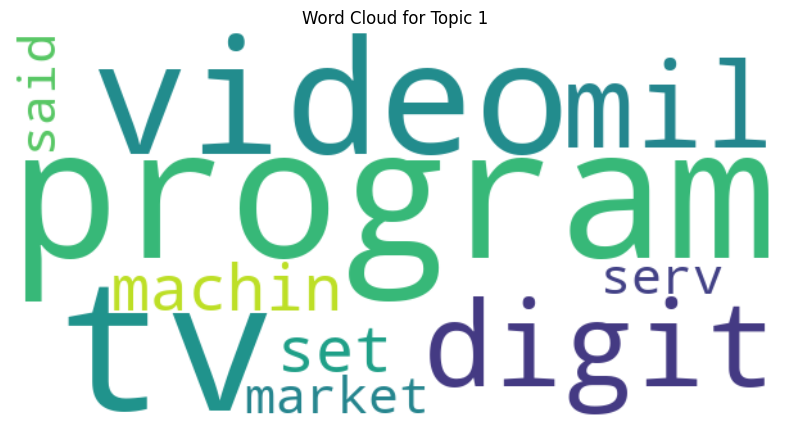

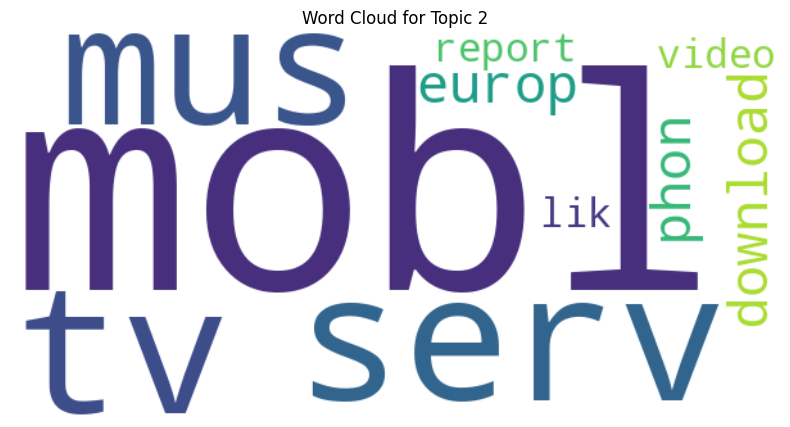

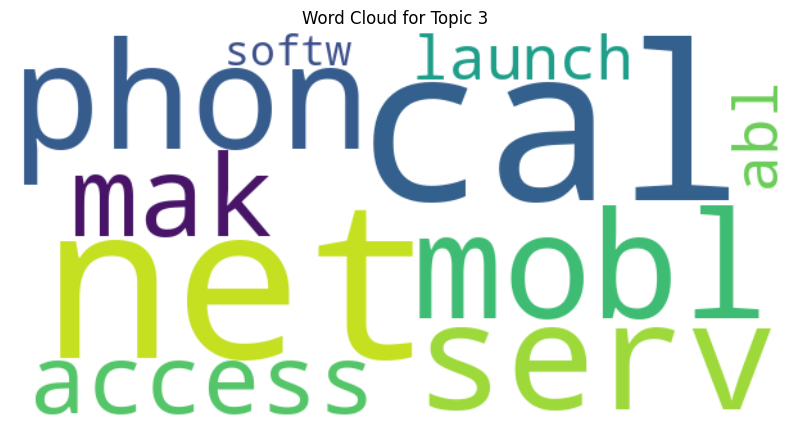

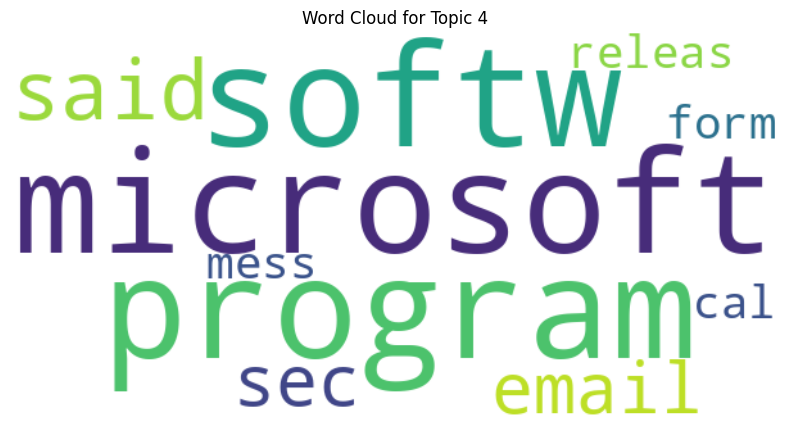

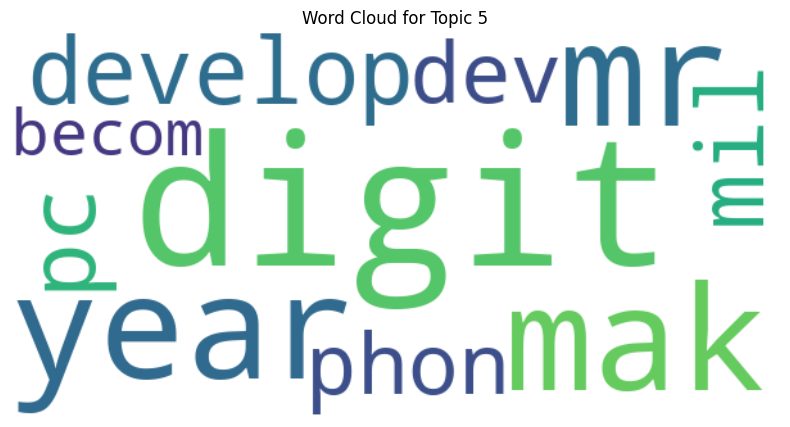

In [35]:
num_topics = 5
# Create a list of topic words and word clouds
topic_wordclouds = []

tfidf_array = tfidf_matrix.toarray()

for i in range(num_topics):
    # Get the TF-IDF values for the current topic
    tfidf_values = tfidf_array[i]

    # Get the indices of the top 10 words for the current topic
    top_word_indices = np.argsort(tfidf_values)[::-1][:10]

    # Get the words associated with the current topic
    topic_words = " ".join([vectorizer.get_feature_names_out()[j] for j in top_word_indices])

    # Generate a word cloud for the current topic
    wordcloud = WordCloud(width=600, height=300, background_color='white').generate(topic_words)
    topic_wordclouds.append(wordcloud)

# Display word clouds for each topic
for i, wordcloud in enumerate(topic_wordclouds):
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f"Word Cloud for Topic {i+1}")
    plt.axis('off')
    plt.show()

#**Model Implementaion and interpretaion.**

**Methods involved:**

we are using a two methods here
Topic Modeling on News Articles  Using NLTK_Gensim

•	Topic Modeling on News Articles  Using NLTK_Gensim

NLTK is a leading platform for building Python programs to work with human language data. It provides easy-to-use interfaces to over 50 corpora and lexical resources such as WordNet, along with a suite of text processing libraries for classification, tokenization, stemming, tagging, parsing, and semantic reasoning, wrappers for industrial-strength NLP libraries, and an active discussion forum.

Thanks to a hands-on guide introducing programming fundamentals alongside topics in computational linguistics, plus comprehensive API documentation, NLTK is suitable for linguists, engineers, students, educators, researchers, and industry users alike. NLTK is available for Windows, Mac OS X, and Linux. Best of all, NLTK is a free, open source, community-driven project.

NLTK has been called “a wonderful tool for teaching, and working in, computational linguistics using Python,” and “an amazing library to play with natural language.

            steps involved in nltk:

•	            Loading the data
•	            Clean the Data
•	            Handling the Stop-words
•	            Stemming
•	            TF-IDF Vectorization
•	            Topic Modelling using Gensim's LDA



**TF-IDF Vectorization**

Bag of words (BoW) converts the text into a feature vector by counting the occurrence of words in a document. It is not considering the importance of words. Term frequency — Inverse document frequency (TFIDF) is based on the Bag of Words (BoW) model, which contains insights about the less relevant and more relevant words in a document. The importance of a word in the text is of great significance in information retrieval.
Example — If you search something on the search engine, with the help of TFIDF values, search engines can give us the most relevant documents related to our search.
6. Bag of words:
Bag of words is a Natural Language Processing technique of text modelling. In technical terms, we can say that it is a method of feature extraction with text data. This approach is a simple and flexible way of extracting features from documents.

A bag of words is a representation of text that describes the occurrence of words within a document. We just keep track of word counts and disregard the grammatical details and the word order. It is called a “bag” of words because any information about the order or structure of words in the document is discarded. The model is only concerned with whether known words occur in the document, not where in the document.

One of the biggest problems with text is that it is messy and unstructured, and machine learning algorithms prefer structured, well defined fixed-length inputs and by using the Bag-of-Words technique we can convert variable-length texts into a fixed-length vector.

Also, at a much granular level, the machine learning models work with numerical data rather than textual data. So to be more specific, by using the bag-of-words (BoW) technique, we convert a text into its equivalent vector of numbers


**Topic Modelling using Gensim's LDA**

Topic Modeling is a technique to extract the hidden topics from large volumes of text. Latent Dirichlet Allocation(LDA) is a popular algorithm for topic modeling with excellent implementations in the Python’s Gensim package. The challenge, however, is how to extract good quality of topics that are clear, segregated and meaningful. This depends heavily on the quality of text preprocessing and the strategy of finding the optimal number of topics.
Can LDA be used for topic Modelling?
Latent Dirichlet Allocation (LDA) is an example of topic model and is used to classify text in a document to a particular topic. It builds a topic per document model and words per topic model, modeled as Dirichlet distributions.

The Work Flow for executing LDA in Python

After importing the required libraries, we will compile all the documents into one list to have the corpus.

We will perform the following text preprocessing steps (can use either spacy or NLTK libraries for preprocessing):

Convert the text into lowercase
Split text into words
Remove the stop loss words
Remove the Punctuation, any symbols, and special characters
Normalize the word (I’ll be using Lemmatization for normalization)


#**Expected Outcomes**

By the end of the project, we anticipate achieving the following outcomes:

**Discovered Topics**: The primary outcome is the identification of latent topics within the news articles. Each topic should represent a coherent and meaningful theme or subject that is present in the dataset.

**Topic Labels:** Assigning meaningful labels or descriptions to each discovered topic is crucial. These labels should provide a clear understanding of the content that each topic represents.

**Topic Distributions**: A distribution of topics across the entire corpus and within individual articles. This information shows how prevalent each topic is in the news articles and how they are distributed.

**Topic Evolution Over Time**: Insights into how topics change and evolve over time. This can be represented as trends, showing which topics have gained or lost prominence during different time periods.

**Visualization:** Visual representations of the topics and their relationships, such as word clouds, topic-document matrices, and topic co-occurrence networks. Visualization aids in the interpretation of results.

**Interactivity:** If applicable, an interactive interface or visualization tool that allows users to explore the discovered topics, related articles, and trends. This enhances the accessibility of the findings.

#**Congrats! Our model is successfully created and ready for deployment on a live server for a real user interaction !!!**



#**Conclusion**


•	Loading the data

•	Clean the Data

•	Transforming text into something an algorithm can digest it a complicated process. We cannot feed the data as it is, some preprocessing needs to be done. In this task we will be doing some preprocessing to convert our data in a form that we can feed our model with.

•	Handling the Stop-words

•	Text may contain stop words like ‘the’, ‘is’, ‘are’. Stop words can be filtered from the text to be processed. There is no universal list of stop words in nlp research, however the nltk module contains a list of stop words. We will remove these stopwords in this task.

•	Lemmatization

•	TF-IDF Vectorization

•	Apart from Count vectorizer an alternative to calculate word frequencies , and by far the most popular method is called TF-IDF. This is an acronym than stands for “Term Frequency – Inverse Document” Frequency which are the components of the resulting scores assigned to each word.

•	Bag of words

•	Topic Modelling using Gensim's LDA

•	One of the drawbacks of LSA is that though it is really fast, its effectiveness in finding good topics is not great. One assumption that LSA makes is that the topics are orthogonal to each other, while Latent Dirichlet Allocation (LDA) relaxes this assumption. Moreover, LDA generalizes the way the documents are generated and this modelling assumption leads to better topics.

•	Effectiveness of LDA Bag of words and LDA TF-IDF model in which LDA TF-IDF gave best probability of 57% and LDA using Bag of words giving 48% probability

•	Effective modeling of topic for unseen document with 42% probability which helps news companies to connect underlaying patterns between topics and can identify similarities with in the topics.


#**Application of our project in industry**

**Content Recommendation:** Topic modeling helps recommend relevant articles to readers based on their interests.

**Content Tagging:** Articles are automatically tagged and categorized for easier retrieval and content organization.

**Trend Analysis:** Identifying trending topics keeps news agencies competitive and ensures timely reporting.

**Content Summarization:** Generates article summaries for quick comprehension.

**Quality Control:** Ensures articles meet editorial standards and consistency in reporting.

**Ad Placement:** Advertisers target ads to relevant articles, boosting campaign effectiveness.

**Archiving and Retrieval:** Organizes historical articles for easy retrieval and research.

**Real-time Monitoring:** Assists financial and trading companies in monitoring news impacting markets.

**Fact-Checking:** Identifies inconsistencies in news coverage, aiding in fact-checking efforts.

**Competitive Analysis:** Helps news outlets compare their coverage with competitors and adjust strategies.

**Personalized Newsletters:** Creates personalized email newsletters based on reader preferences.

**Emerging Trends:** Identifies emerging news topics for early reporting.